# EfficientRainbow ± FHR on Atari-100k — 5-seed pooled results (seeds 0–4)

**Branch `soup/atari-cx3-hpc` · CX3 `ref` campaign · executed 2026-09-16**

Five-seed follow-up to `exp_atari100k_effrainbow.ipynb` (seed 0, single GB10). The
protocol is unchanged (see that notebook and `src/analysis/atari100k.py`): 100k
agent–env interactions, deterministic ALE, the EfficientRainbow recipe at replay
ratio 2, final-policy evaluation of 32 episodes at ε = 0.001, raw game scores,
HNS = (agent − random)/(human − random) with the Wang et al. (2016) references.

**Pooling.** Seeds 1–4 are the `effrainbow100kref` family trained on CX3
(`config_effrainbow_100k_ref.yaml`, a pre-instrumentation replica of the seed-0
protocol; job list `experiments/hpc/cx3/jobs_ref.txt`), read from each game dir's
`cached/effrainbow100kref_runs_manifest.json` (rebuilt with
`experiments/src/rebuild_atari_manifests.py --family ref`). Seed 0 is the
`effrainbow100k` family of the seed-0 notebook: it is read from that manifest when
its run dirs are on this machine, otherwise from `SEED0_FALLBACK` below (the raw
scores printed by the executed seed-0 notebook, 1 d.p.). Krull's seed-0 entry is the
mean of that family's seeds 0 and 1, exactly as the seed-0 notebook reported it.

**Coverage.** All 216 CX3 runs finished. The first (4-core) array walltime-killed the
FHR arm on **KungFuMaster and MsPacman** (seeds 1–4); `experiments/hpc/cx3/jobs_ref_resub2.txt`
(2026-09-15, 8 cores) recovered 6 of them and `jobs_ref_resub3.txt` (2026-09-16) the last
two, after a GPU ECC fault on node cx3-20-2 had killed KungFuMaster seeds 3–4 once more.
Every game therefore enters both arms with 5 seeds; the seed-count marks in the figures
are dormant (they reappear automatically if a manifest ever loses a run).

**Arms**: `baseline` = EfficientRainbow, TD only (`fhr_weight: 0`); `exp3` = the same
agent + FHR (**λ = 2, r = 8**), the arm selected by the 50k tuning grid. They are each
other's controls — the config diff is the FHR block alone.

**Aggregates** over the 26 suite games (Enduro never enters): *mean* and *median* HNS
of the per-game mean score, as in the seed-0 notebook and the poster; *IQM* =
interquartile mean over all runs with every game weighted equally (Agarwal et al.
2021, "Deep RL at the edge of the statistical precipice"), with stratified per-game
bootstrap 95 % CIs; and the probability of improvement P(FHR > baseline).

**Published numbers** are quoted verbatim per method from ONE source each (`PUBLISHED`
below): EfficientZero Table 1 (Ye et al. 2021) for SimPLe, OTRainbow, CURL, DrQ, SPR,
MuZero, EfficientZero — the table `src/analysis/atari100k.py` carries; BBF Table A.1
(Schwarzer et al. 2023) for DER, DrQ(ε), SR-SPR, BBF; DIAMOND Table 1 (Alonso et al.
2024) for TWM, IRIS, STORM, DIAMOND; the DreamerV3 paper's numbers as tabulated in
STORM Table 2 for DreamerV3 (DIAMOND's DreamerV3 column does not reproduce the mean it
prints, so it is not used). Mean/median HNS of published methods are recomputed here
from their per-game scores (the cell asserts they reproduce the papers' printed rows).
IQM is only ever *quoted* (it needs per-run data): from BBF Table A.1 or DIAMOND
Table 1; the † IQMs (SPR, EfficientZero, DreamerV3) come from those papers'
re-tabulations of the method rather than the method's own paper.


## 0 · Load the pooled runs

`SCORES[game][arm]` = {seed: final-evaluation mean score}. Nothing is launched from
here — the CX3 arrays are the only producer of seeds 1–4.

In [1]:
import json, pathlib, sys, warnings
import numpy as np
import matplotlib.pyplot as plt
import yaml

HERE = pathlib.Path.cwd()                       # experiments/atari
SRC = HERE.parents[1] / "src"                   # repo library code
if str(SRC) not in sys.path:
    sys.path.insert(0, str(SRC))
from analysis.atari100k import REFERENCE, BASELINES, BENCHMARK_GAMES, hns, game_key

plt.rcParams.update({
    "figure.dpi": 110, "axes.grid": True, "grid.alpha": 0.25,
    "axes.spines.top": False, "axes.spines.right": False,
    "font.size": 10, "axes.titlesize": 11, "axes.titleweight": "bold",
    "legend.frameon": False,
})

REF_CONFIG = "config_effrainbow_100k_ref.yaml"
REF_MANIFEST = "cached/effrainbow100kref_runs_manifest.json"     # seeds 1-4 (CX3)
SEED0_MANIFEST = "cached/effrainbow100k_runs_manifest.json"      # seed 0 (GB10)
ARMS = ["baseline", "exp3"]

# Seed-0 raw final-evaluation scores (EffRainbow, +FHR) as printed by the executed
# exp_atari100k_effrainbow.ipynb results table (2026-08-28). Used only when the
# effrainbow100k run dirs are not on this machine (e.g. the CX3 clone).
SEED0_FALLBACK = {
    "Alien": (631.6, 1201.2),      "Amidar": (109.9, 119.8),
    "Assault": (598.7, 593.5),     "Asterix": (948.4, 715.6),
    "BankHeist": (52.5, 513.4),    "BattleZone": (9937.5, 10218.8),
    "Boxing": (8.6, 26.3),         "Breakout": (19.9, 15.2),
    "ChopperCommand": (1993.8, 896.9), "CrazyClimber": (23993.8, 22646.9),
    "DemonAttack": (1880.0, 1282.2), "Enduro": (132.8, 189.9),
    "Freeway": (29.6, 29.6),       "Frostbite": (1127.5, 2606.6),
    "Gopher": (312.5, 316.9),      "Hero": (7091.2, 2930.0),
    "Jamesbond": (392.2, 337.5),   "Kangaroo": (575.0, 656.2),
    "Krull": (4212.2, 5035.6),     "KungFuMaster": (9656.2, 9818.8),
    "MsPacman": (986.2, 1009.7),   "Pong": (-14.6, -17.0),
    "PrivateEye": (87.5, 100.0),   "Qbert": (1835.9, 4050.8),
    "RoadRunner": (9118.8, 9100.0), "Seaquest": (321.2, 505.0),
    "UpNDown": (4448.8, 2517.8),
}

def _eval_mean(run_dir):
    p = run_dir / "eval_summary.json"
    return json.load(open(p))["mean"] if p.exists() else None

def seed0_score(gd, arm, key):
    # effrainbow100k manifest run dirs when present (user machine), else fallback
    p = gd / SEED0_MANIFEST
    if p.exists():
        vals = [_eval_mean(gd / rel)
                for rel in json.load(open(p))["runs"].get(arm, {}).values()]
        vals = [v for v in vals if v is not None]
        if vals:
            return float(np.mean(vals)), "manifest"
    return SEED0_FALLBACK[key][ARMS.index(arm)], "fallback"

SCORES, SEED0_SRC, OVERRIDES = {}, {}, {}
for gd in sorted(HERE.glob("dqn_*")):
    if not (gd / REF_CONFIG).exists():
        continue
    key = game_key(yaml.safe_load(open(gd / REF_CONFIG))["environment"]["name"])
    ref = (json.load(open(gd / REF_MANIFEST)) if (gd / REF_MANIFEST).exists()
           else {"runs": {}, "overrides": {}})
    if "exp3" in ref.get("overrides", {}):
        OVERRIDES[key] = ref["overrides"]["exp3"]
    SCORES[key] = {}
    for arm in ARMS:
        s0, SEED0_SRC[(key, arm)] = seed0_score(gd, arm, key)
        d = {"0": s0}
        for seed, rel in sorted(ref["runs"].get(arm, {}).items()):
            v = _eval_mean(gd / rel)
            if v is not None:
                d[seed] = v
        SCORES[key][arm] = d

GAMES = list(SCORES)
AGG = [k for k in GAMES if k in BENCHMARK_GAMES]         # suite games only
ov = next(iter(OVERRIDES.values()))
assert all(o == ov for o in OVERRIDES.values()), OVERRIDES
OUR_LABEL = {"baseline": "EfficientRainbow (TD only)",
             "exp3": f"+ FHR (λ={ov['fhr_weight']:g}, r={ov['fhr_order']})"}
OUR_COLOR = {"baseline": "steelblue", "exp3": "indianred"}

def hns_runs(key, arm):
    return np.array([hns(v, key) for v in SCORES[key][arm].values()])
def mean_score(key, arm):
    return float(np.mean(list(SCORES[key][arm].values())))
def n_seeds(key, arm):
    return len(SCORES[key][arm])
ONE_SEED = [k for k in GAMES if min(n_seeds(k, a) for a in ARMS) < 5]

print(f"{'game':15s} {'seed-0 src':10s}  baseline seeds        exp3 seeds")
for k in GAMES:
    print(f"{k:15s} {SEED0_SRC[(k, 'baseline')]:10s}  "
          f"{','.join(SCORES[k]['baseline']):14s}({n_seeds(k, 'baseline')})  "
          f"{','.join(SCORES[k]['exp3']):14s}({n_seeds(k, 'exp3')})"
          + (f"   <-- FHR arm: {n_seeds(k, 'exp3')}/5 seeds" if k in ONE_SEED else ""))
n_runs = sum(n_seeds(k, a) for k in GAMES for a in ARMS)
print(f"\n{len(GAMES)} games ({len(AGG)} of {len(BENCHMARK_GAMES)} suite games), "
      f"{n_runs} runs pooled; exp3 overrides {ov}")


game            seed-0 src  baseline seeds        exp3 seeds
Alien           fallback    0,1,2,3,4     (5)  0,1,2,3,4     (5)
Amidar          fallback    0,1,2,3,4     (5)  0,1,2,3,4     (5)
Assault         fallback    0,1,2,3,4     (5)  0,1,2,3,4     (5)
Asterix         fallback    0,1,2,3,4     (5)  0,1,2,3,4     (5)
BankHeist       fallback    0,1,2,3,4     (5)  0,1,2,3,4     (5)
BattleZone      fallback    0,1,2,3,4     (5)  0,1,2,3,4     (5)
Boxing          fallback    0,1,2,3,4     (5)  0,1,2,3,4     (5)
Breakout        fallback    0,1,2,3,4     (5)  0,1,2,3,4     (5)
ChopperCommand  fallback    0,1,2,3,4     (5)  0,1,2,3,4     (5)
CrazyClimber    fallback    0,1,2,3,4     (5)  0,1,2,3,4     (5)
DemonAttack     fallback    0,1,2,3,4     (5)  0,1,2,3,4     (5)
Enduro          fallback    0,1,2,3,4     (5)  0,1,2,3,4     (5)
Freeway         fallback    0,1,2,3,4     (5)  0,1,2,3,4     (5)
Frostbite       fallback    0,1,2,3,4     (5)  0,1,2,3,4     (5)
Gopher          fallback    0

## 1 · Results table — 5-seed means

Raw final-evaluation scores, mean ± sd over seeds (n). Δ and ΔHNS compare the
per-game means; P(FHR > base) is the fraction of (FHR seed, baseline seed) pairs the
FHR run wins (ties count ½).

In [2]:
def _fmt(v):
    return f"{v.mean():.1f} ± {v.std(ddof=1):.1f} ({len(v)})" if len(v) > 1 else f"{v.mean():.1f} (1)"

hdr = ["Game", "Random", "Human", "EffRainbow", "+FHR", "Δ", "ΔHNS", "P(FHR>base)"]
rows, wins, losses, ties, DHNS = [], [], [], [], {}
for k in GAMES:
    b = np.array(list(SCORES[k]["baseline"].values()))
    f = np.array(list(SCORES[k]["exp3"].values()))
    d = f.mean() - b.mean()
    dh = hns(f.mean(), k) - hns(b.mean(), k)
    p = float(np.mean([(x > y) + 0.5 * (x == y) for x in f for y in b]))
    rows.append([k + ("*" if k in ONE_SEED else ""), f"{REFERENCE[k]['random']:.1f}",
                 f"{REFERENCE[k]['human']:.1f}", _fmt(b), _fmt(f), f"{d:+.1f}",
                 f"{dh:+.3f}", f"{p:.2f}"])
    if k in AGG:
        DHNS[k] = dh
        (wins if d > 0 else losses if d < 0 else ties).append(k)
w = [max(len(r[i]) for r in [hdr] + rows) for i in range(len(hdr))]
for r in [hdr] + rows:
    print("  ".join(s.rjust(w[i]) for i, s in enumerate(r)))
dh = np.array(list(DHNS.values()))
if ONE_SEED:
    print("\n* = FHR arm has fewer than 5 seeds: "
          + ", ".join(f"{k} {n_seeds(k, 'exp3')}/5" for k in ONE_SEED) + " (baseline has 5 seeds)")
print(f"FHR vs baseline on the {len(AGG)} suite games (per-game mean score): "
      f"{len(wins)} wins / {len(losses)} losses / {len(ties)} ties")
print(f"per-game ΔHNS: mean {dh.mean():+.3f}  median {np.median(dh):+.3f}  "
      f"IQR [{np.percentile(dh, 25):+.3f}, {np.percentile(dh, 75):+.3f}]")
print("biggest wins  :", [(k, round(v, 3)) for k, v in sorted(DHNS.items(), key=lambda t: -t[1])[:5]])
print("biggest losses:", [(k, round(v, 3)) for k, v in sorted(DHNS.items(), key=lambda t: t[1])[:5]])


          Game   Random    Human            EffRainbow                  +FHR        Δ    ΔHNS  P(FHR>base)
         Alien    227.8   7127.7     817.3 ± 176.9 (5)     903.4 ± 230.4 (5)    +86.0  +0.012         0.64
        Amidar      5.8   1719.5      125.1 ± 20.3 (5)      148.8 ± 23.3 (5)    +23.7  +0.014         0.80
       Assault    222.4    742.0      641.5 ± 28.7 (5)      621.5 ± 29.5 (5)    -20.0  -0.039         0.28
       Asterix    210.0   8503.3      939.7 ± 85.3 (5)     910.6 ± 134.1 (5)    -29.1  -0.004         0.50
     BankHeist     14.2    753.1       53.9 ± 12.3 (5)     219.0 ± 231.7 (5)   +165.1  +0.223         0.60
    BattleZone   2360.0  37187.5  15637.5 ± 9383.7 (5)  14812.5 ± 9516.4 (5)   -825.0  -0.024         0.48
        Boxing      0.1     12.1        11.5 ± 3.4 (5)        17.6 ± 7.6 (5)     +6.1  +0.510         0.84
      Breakout      1.7     30.5        15.3 ± 2.9 (5)       27.6 ± 22.1 (5)    +12.3  +0.428         0.80
ChopperCommand    811.0   7387.8    1

## 2 · Human-normalised score per game

Grey bars = the seven published methods carried by `src/analysis/atari100k.py`
(EfficientZero Table 1); coloured = our two arms (bar = HNS of the 5-seed mean score,
dots = individual seeds). Games marked * have fewer than five FHR seeds (the count is in the title).

Report figure: rendered with the larger `REPORT_RC` fonts and written as a 600-dpi PNG
plus a vector PDF (use the PDF in LaTeX — it scales without pixelation).


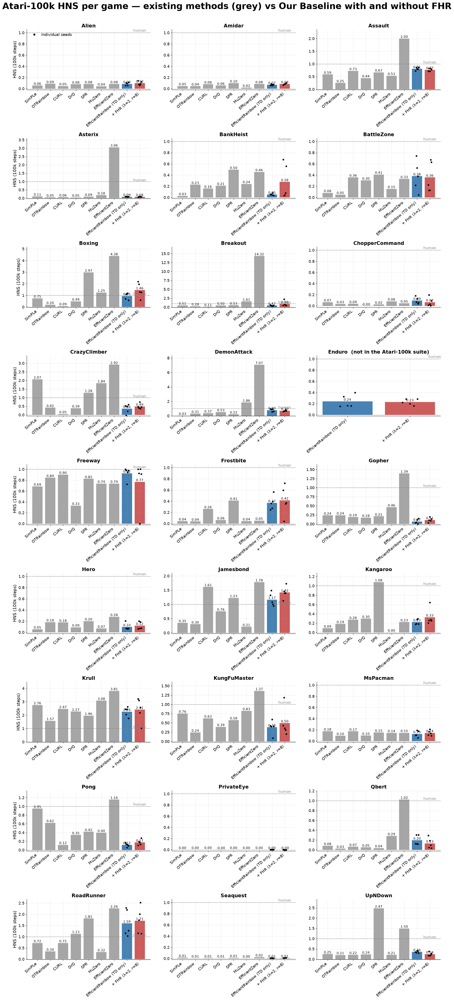

In [3]:
FIGDIR = HERE / "cached" / "atari100k_effrainbow_5seed_figures"
FIGDIR.mkdir(parents=True, exist_ok=True)
SAVE_DPI = 600

def save_and_show(fig, slug, dpi=SAVE_DPI):
    # 600-dpi PNG for slides/quick viewing + vector PDF for the LaTeX report
    fig.savefig(FIGDIR / f"{slug}.png", dpi=dpi, bbox_inches="tight")
    fig.savefig(FIGDIR / f"{slug}.pdf", bbox_inches="tight")
    plt.show()

# Larger type for the multi-panel report figures (applied with plt.rc_context so the
# other figures in this notebook keep the default sizes).
REPORT_RC = {"font.size": 13, "axes.titlesize": 15, "axes.labelsize": 13,
             "xtick.labelsize": 12, "ytick.labelsize": 11.5, "legend.fontsize": 12}
HNS_TITLE = ("Atari-100k HNS per game — existing methods (grey) vs "
             "Our Baseline with and without FHR")

PUBLISHED_PER_GAME = ["SimPLe", "OTRainbow", "CURL", "DrQ", "SPR", "MuZero", "EfficientZero"]
NCOLS = 3
NROWS = -(-len(GAMES) // NCOLS)
with plt.rc_context(REPORT_RC):
    fig, axes = plt.subplots(NROWS, NCOLS, figsize=(6.2 * NCOLS, 4.7 * NROWS), squeeze=False)
    for ax in axes.flat[len(GAMES):]:
        ax.set_visible(False)
    for ax, k in zip(axes.flat, GAMES):
        names, vals, cols = [], [], []
        for m in PUBLISHED_PER_GAME:
            if m in BASELINES[k]:
                names.append(m); vals.append(hns(BASELINES[k][m], k)); cols.append("0.65")
        for a in ARMS:
            names.append(OUR_LABEL[a]); vals.append(hns(mean_score(k, a), k)); cols.append(OUR_COLOR[a])
        x = np.arange(len(names))
        ax.bar(x, vals, color=cols)
        for a in ARMS:
            i = names.index(OUR_LABEL[a]); sh = hns_runs(k, a)
            ax.scatter(i + np.linspace(-0.12, 0.12, len(sh)), sh, color="k", s=16, zorder=3)
        ax.axhline(1.0, ls="--", c="gray", lw=1); ax.axhline(0.0, ls=":", c="gray", lw=1)
        lo = min([0] + vals + [v for a in ARMS for v in hns_runs(k, a)])
        hi = max([1.06] + [v * 1.18 for v in vals] + [v * 1.05 for a in ARMS for v in hns_runs(k, a)])
        ax.text(len(names) - 0.5, 1.02, "human", ha="right", fontsize=11, color="gray")
        for xi, v in zip(x, vals):
            ax.text(xi, v + hi * 0.012, f"{v:.2f}", ha="center", fontsize=10)
        ax.set_ylim(lo * 1.2 - 0.02, hi)
        ax.set_xticks(x); ax.set_xticklabels(names, rotation=40, ha="right")
        ax.set_title(k + (f"  * (FHR: {n_seeds(k, 'exp3')}/5 seeds)" if k in ONE_SEED else "")
                     + ("" if BASELINES[k] else "  (not in the Atari-100k suite)"))
    for row in axes:
        row[0].set_ylabel("HNS (100k steps)")
    axes.flat[0].legend(handles=[plt.Line2D([], [], marker="o", color="k", ls="", ms=5,
                                            label="individual seeds")], loc="upper left")
    fig.suptitle(HNS_TITLE, fontsize=27, fontweight="bold", y=1.0 + 0.03 / NROWS)
    fig.tight_layout()
    save_and_show(fig, "atari100k_effrainbow_5seed_hns_per_game")


## 3 · Published Atari-100k methods — per-game scores and quoted IQMs

One source per method (see the header). The assertion checks that the mean HNS
recomputed from each transcribed column reproduces the paper's printed "Mean" row.

In [4]:
# BBF, Schwarzer et al. 2023 (arXiv:2305.19452), Table A.1 — raw scores, 26 games.
# Columns: DER, DrQ(ε), SPR†, IRIS, SR-SPR, EfficientZero†, BBF  († = BBF's re-evaluation)
_BBF_A1_COLS = ("DER", "DrQ(ε)", "SPR†", "IRIS", "SR-SPR", "EfficientZero†", "BBF")
_BBF_A1 = {
    "Alien":          (802.3, 865.2, 841.9, 420.0, 1107.8, 808.5, 1173.2),
    "Amidar":         (125.9, 137.8, 179.7, 143.0, 203.4, 148.6, 244.6),
    "Assault":        (561.5, 579.6, 565.6, 1524.4, 1088.9, 1263.1, 2098.5),
    "Asterix":        (535.4, 763.6, 962.5, 853.6, 903.1, 25557.8, 3946.1),
    "BankHeist":      (185.5, 232.9, 345.4, 53.1, 531.7, 351.0, 732.9),
    "BattleZone":     (8977.0, 10165.3, 14834.1, 13074.0, 17671.0, 13871.2, 24459.8),
    "Boxing":         (-0.3, 9.0, 35.7, 70.1, 45.8, 52.7, 85.8),
    "Breakout":       (9.2, 19.8, 19.6, 83.7, 25.5, 414.1, 370.6),
    "ChopperCommand": (925.9, 844.6, 946.3, 1565.0, 2362.1, 1117.3, 7549.3),
    "CrazyClimber":   (34508.6, 21539.0, 36700.5, 59324.2, 45544.1, 83940.2, 58431.8),
    "DemonAttack":    (627.6, 1321.5, 517.6, 2034.4, 2814.4, 13003.9, 13341.4),
    "Freeway":        (20.9, 20.3, 19.3, 31.1, 25.4, 21.8, 25.5),
    "Frostbite":      (871.0, 1014.2, 1170.7, 259.1, 2584.8, 296.3, 2384.8),
    "Gopher":         (467.0, 621.6, 660.6, 2236.1, 712.4, 3260.3, 1331.2),
    "Hero":           (6226.0, 4167.9, 5858.6, 7037.4, 8524.0, 9315.9, 7818.6),
    "Jamesbond":      (275.7, 349.1, 366.5, 462.7, 389.1, 517.0, 1129.6),
    "Kangaroo":       (581.7, 1088.4, 3617.4, 838.2, 3631.7, 724.1, 6614.7),
    "Krull":          (3256.9, 4402.1, 3681.6, 6616.4, 5911.8, 5663.3, 8223.4),
    "KungFuMaster":   (6580.1, 11467.4, 14783.2, 21759.8, 18649.4, 30944.8, 18991.7),
    "MsPacman":       (1187.4, 1218.1, 1318.4, 999.1, 1574.1, 1281.2, 2008.3),
    "Pong":           (-9.7, -9.1, -5.4, 14.6, 2.9, 20.1, 16.7),
    "PrivateEye":     (72.8, 3.5, 86.0, 100.0, 97.9, 96.7, 40.5),
    "Qbert":          (1773.5, 1810.7, 866.3, 745.7, 4044.1, 14448.5, 4447.1),
    "RoadRunner":     (11843.4, 11211.4, 12213.1, 9614.6, 13463.4, 17751.3, 33426.8),
    "Seaquest":       (304.6, 352.3, 558.1, 661.3, 819.0, 1100.2, 1232.5),
    "UpNDown":        (3075.0, 4324.5, 10859.2, 3546.2, 112450.3, 17264.2, 12101.7),
}
_BBF_A1_PRINTED = {   # the table's own aggregate rows: (IQM, Median, Mean)
    "DER": (0.183, 0.189, 0.350), "DrQ(ε)": (0.280, 0.313, 0.465),
    "SPR†": (0.337, 0.396, 0.616), "IRIS": (0.501, 0.289, 1.046),
    "SR-SPR": (0.631, 0.685, 1.272), "EfficientZero†": (1.020, 1.116, 1.945),
    "BBF": (1.045, 0.917, 2.247),
}
# DIAMOND, Alonso et al. 2024 (arXiv:2405.12399), Table 1 — raw scores, 26 games.
# Columns: SimPLe‡, TWM, IRIS, DreamerV3, STORM, DIAMOND  (‡ = the other SimPLe variant)
_DIAMOND_T1_COLS = ("SimPLe‡", "TWM", "IRIS", "DreamerV3", "STORM", "DIAMOND")
_DIAMOND_T1 = {
    "Alien":          (616.9, 674.6, 420.0, 959.0, 983.6, 744.1),
    "Amidar":         (74.3, 121.8, 143.0, 139.0, 204.8, 225.8),
    "Assault":        (527.2, 682.6, 1524.4, 706.0, 801.0, 1526.4),
    "Asterix":        (1128.3, 1116.6, 853.6, 932.0, 1028.0, 3698.5),
    "BankHeist":      (34.2, 466.7, 53.1, 649.0, 641.2, 19.7),
    "BattleZone":     (4031.2, 5068.0, 13074.0, 12250.0, 13540.0, 4702.0),
    "Boxing":         (7.8, 77.5, 70.1, 78.0, 79.7, 86.9),
    "Breakout":       (16.4, 20.0, 83.7, 31.0, 15.9, 132.5),
    "ChopperCommand": (979.4, 1697.4, 1565.0, 420.0, 1888.0, 1369.8),
    "CrazyClimber":   (62583.6, 71820.4, 59324.2, 97190.0, 66776.0, 99167.8),
    "DemonAttack":    (208.1, 350.2, 2034.4, 303.0, 164.6, 288.1),
    "Freeway":        (16.7, 24.3, 31.1, 0.0, 33.5, 33.3),
    "Frostbite":      (236.9, 1475.6, 259.1, 909.0, 1316.0, 274.1),
    "Gopher":         (596.8, 1674.8, 2236.1, 3730.0, 8239.6, 5897.9),
    "Hero":           (2656.6, 7254.0, 7037.4, 11161.0, 11044.3, 5621.8),
    "Jamesbond":      (100.5, 362.4, 462.7, 445.0, 509.0, 427.4),
    "Kangaroo":       (51.2, 1240.0, 838.2, 4098.0, 4208.0, 5382.2),
    "Krull":          (2204.8, 6349.2, 6616.4, 7782.0, 8412.6, 8610.1),
    "KungFuMaster":   (14862.5, 24554.6, 21759.8, 21420.0, 26182.0, 18713.6),
    "MsPacman":       (1480.0, 1588.4, 999.1, 1327.0, 2673.5, 1958.2),
    "Pong":           (12.8, 18.8, 14.6, 18.0, 11.3, 20.4),
    "PrivateEye":     (35.0, 86.6, 100.0, 882.0, 7781.0, 114.3),
    "Qbert":          (1288.8, 3330.8, 745.7, 3405.0, 4522.5, 4499.3),
    "RoadRunner":     (5640.6, 9109.0, 9614.6, 15565.0, 17564.0, 20673.2),
    "Seaquest":       (683.3, 774.4, 661.3, 618.0, 525.2, 551.2),
    "UpNDown":        (3350.3, 15981.7, 3546.2, 9234.0, 7985.0, 3856.3),
}
_DIAMOND_T1_PRINTED = {   # (IQM, Mean) rows of Table 1 (it prints no median)
    "SimPLe‡": (0.130, 0.332), "TWM": (0.459, 0.956), "IRIS": (0.501, 1.046),
    "STORM": (0.636, 1.266), "DIAMOND": (0.641, 1.459),
    # DreamerV3 is deliberately absent: DIAMOND prints (0.497, 1.097) but its
    # DreamerV3 column recomputes to a mean of 1.130, so that column is not quoted.
}
# DreamerV3, Hafner et al. 2023, as tabulated (rounded to integers) in STORM Table 2
# (Zhang et al. 2023, arXiv:2310.09615), whose printed rows are mean 112 %, median 49 %.
_STORM_T2_DREAMERV3 = {
    "Alien": 959, "Amidar": 139, "Assault": 706, "Asterix": 932, "BankHeist": 649,
    "BattleZone": 12250, "Boxing": 78, "Breakout": 31, "ChopperCommand": 420,
    "CrazyClimber": 97190, "DemonAttack": 303, "Freeway": 0, "Frostbite": 909,
    "Gopher": 3730, "Hero": 11161, "Jamesbond": 445, "Kangaroo": 4098, "Krull": 7782,
    "KungFuMaster": 21420, "MsPacman": 1327, "Pong": 18, "PrivateEye": 882,
    "Qbert": 3405, "RoadRunner": 15565, "Seaquest": 618, "UpNDown": 7667,
}
_STORM_T2_DREAMERV3_PRINTED = (1.12, 0.49)   # (Mean, Median), 2 d.p.

def _col(table, cols, name):
    # tuple rows (transcribed tables) or dict rows (BASELINES from the module)
    if cols is None:
        return {g: row[name] for g, row in table.items() if name in row}
    return {g: row[cols.index(name)] for g, row in table.items()}

def agg(scores):   # mean / median HNS over the 26 suite games, from per-game scores
    per = np.array([hns(scores[g], g) for g in BENCHMARK_GAMES])
    return float(per.mean()), float(np.median(per))

# transcription check: recomputed means must reproduce the printed rows
for name, (_, _, mean_printed) in _BBF_A1_PRINTED.items():
    m, _ = agg(_col(_BBF_A1, _BBF_A1_COLS, name))
    assert abs(m - mean_printed) < 2.5e-3, (name, m, mean_printed)
for name, (_, mean_printed) in _DIAMOND_T1_PRINTED.items():
    m, _ = agg(_col(_DIAMOND_T1, _DIAMOND_T1_COLS, name))
    assert abs(m - mean_printed) < 2.5e-3, (name, m, mean_printed)
m, md = agg(_STORM_T2_DREAMERV3)
assert abs(m - _STORM_T2_DREAMERV3_PRINTED[0]) < 6e-3 and abs(md - _STORM_T2_DREAMERV3_PRINTED[1]) < 6e-3, (m, md)
print("transcribed BBF A.1 / DIAMOND T1 / STORM T2 columns reproduce the printed aggregate rows")

EZ = "EfficientZero Table 1"; BBFA = "BBF Table A.1"; DIA = "DIAMOND Table 1"
STORM_T2 = "DreamerV3 paper via STORM Table 2"
PUBLISHED = {   # name -> family, per-game raw scores, source, quoted IQM (+ its source)
    "OTRainbow":     dict(family="model-free",  scores=_col(BASELINES, None, "OTRainbow"), src=EZ, iqm=None),
    "CURL":          dict(family="model-free",  scores=_col(BASELINES, None, "CURL"), src=EZ, iqm=None),
    "DrQ":           dict(family="model-free",  scores=_col(BASELINES, None, "DrQ"), src=EZ, iqm=None),
    "DER":           dict(family="model-free",  scores=_col(_BBF_A1, _BBF_A1_COLS, "DER"), src=BBFA, iqm=0.183, iqm_src=BBFA),
    "DrQ(ε)":        dict(family="model-free",  scores=_col(_BBF_A1, _BBF_A1_COLS, "DrQ(ε)"), src=BBFA, iqm=0.280, iqm_src=BBFA),
    "SPR":           dict(family="model-free",  scores=_col(BASELINES, None, "SPR"), src=EZ, iqm=0.337, iqm_src=BBFA + " (re-evaluation †)"),
    "SR-SPR":        dict(family="model-free",  scores=_col(_BBF_A1, _BBF_A1_COLS, "SR-SPR"), src=BBFA, iqm=0.631, iqm_src=BBFA),
    "BBF":           dict(family="model-free",  scores=_col(_BBF_A1, _BBF_A1_COLS, "BBF"), src=BBFA, iqm=1.045, iqm_src=BBFA),
    "SimPLe":        dict(family="model-based", scores=_col(BASELINES, None, "SimPLe"), src=EZ, iqm=None),
    "MuZero":        dict(family="model-based", scores=_col(BASELINES, None, "MuZero"), src=EZ, iqm=None),
    "TWM":           dict(family="model-based", scores=_col(_DIAMOND_T1, _DIAMOND_T1_COLS, "TWM"), src=DIA, iqm=0.459, iqm_src=DIA),
    "IRIS":          dict(family="model-based", scores=_col(_DIAMOND_T1, _DIAMOND_T1_COLS, "IRIS"), src=DIA, iqm=0.501, iqm_src=DIA),
    "DreamerV3":     dict(family="model-based", scores=dict(_STORM_T2_DREAMERV3), src=STORM_T2, iqm=0.497, iqm_src=DIA + " (its own DreamerV3 tabulation †)"),
    "STORM":         dict(family="model-based", scores=_col(_DIAMOND_T1, _DIAMOND_T1_COLS, "STORM"), src=DIA, iqm=0.636, iqm_src=DIA),
    "DIAMOND":       dict(family="model-based", scores=_col(_DIAMOND_T1, _DIAMOND_T1_COLS, "DIAMOND"), src=DIA, iqm=0.641, iqm_src=DIA),
    "EfficientZero": dict(family="model-based", scores=_col(BASELINES, None, "EfficientZero"), src=EZ, iqm=1.020, iqm_src=BBFA + " (re-evaluation †)"),
}
for name, d in PUBLISHED.items():
    d["mean"], d["median"] = agg(d["scores"])

print(f"{'method':14s} {'family':12s} {'mean':>6s} {'median':>7s} {'IQM':>6s}   source")
for name, d in PUBLISHED.items():
    iqm_s = f"{d['iqm']:.3f}" if d["iqm"] is not None else "n/a"
    note = f"; IQM: {d['iqm_src']}" if d.get("iqm_src") and d["iqm_src"] != d["src"] else ""
    print(f"{name:14s} {d['family']:12s} {d['mean']:6.3f} {d['median']:7.3f} {iqm_s:>6s}   {d['src']}{note}")


transcribed BBF A.1 / DIAMOND T1 / STORM T2 columns reproduce the printed aggregate rows
method         family         mean  median    IQM   source
OTRainbow      model-free    0.264   0.204    n/a   EfficientZero Table 1
CURL           model-free    0.381   0.175    n/a   EfficientZero Table 1
DrQ            model-free    0.357   0.268    n/a   EfficientZero Table 1
DER            model-free    0.350   0.189  0.183   BBF Table A.1
DrQ(ε)         model-free    0.465   0.312  0.280   BBF Table A.1
SPR            model-free    0.703   0.415  0.337   EfficientZero Table 1; IQM: BBF Table A.1 (re-evaluation †)
SR-SPR         model-free    1.271   0.684  0.631   BBF Table A.1
BBF            model-free    2.247   0.917  1.045   BBF Table A.1
SimPLe         model-based   0.443   0.144    n/a   EfficientZero Table 1
MuZero         model-based   0.562   0.227    n/a   EfficientZero Table 1
TWM            model-based   0.956   0.505  0.459   DIAMOND Table 1
IRIS           model-based   1.046   0

## 4 · Our aggregates — mean, median, IQM with bootstrap CIs

Mean/median HNS over the 26 suite games use the per-game 5-seed mean score (the
seed-0 notebook's and the poster's definition). IQM is the interquartile mean over all
pooled runs with every game weighted equally (weight 1/n_seeds per run, so a game
with fewer FHR seeds still counts once like every other game). CIs: stratified bootstrap
(resample seeds within each game, 2000 replicates, percentile 95 %); a game with fewer
seeds contributes less seed variance, so the FHR CIs are slightly optimistic.

In [5]:
def iqm(values, weights=None):
    # interquartile mean with (optional) weights: drop the lowest and highest 25 % of
    # total weight, mean of what remains (equals rliable's IQM for equal weights)
    v = np.asarray(values, float)
    w = np.ones_like(v) if weights is None else np.asarray(weights, float)
    o = np.argsort(v); v, w = v[o], w[o]
    cw = np.cumsum(w); lo, hi = 0.25 * cw[-1], 0.75 * cw[-1]
    inside = np.clip(np.minimum(cw, hi) - np.maximum(cw - w, lo), 0, None)
    return float((v * inside).sum() / inside.sum())

def stat_mean(sample):   return float(np.mean([v.mean() for v in sample]))
def stat_median(sample): return float(np.median([v.mean() for v in sample]))
def stat_iqm(sample):
    vals = np.concatenate(sample)
    wts = np.concatenate([np.full(len(v), 1.0 / len(v)) for v in sample])
    return iqm(vals, wts)
STATS = {"mean": stat_mean, "median": stat_median, "IQM": stat_iqm}

RNG = np.random.default_rng(0)
N_BOOT = 2000
def bootstrap(arm, n=N_BOOT):
    per_game = [hns_runs(k, arm) for k in AGG]
    point = {s: f(per_game) for s, f in STATS.items()}
    reps = {s: [] for s in STATS}
    for _ in range(n):
        sample = [RNG.choice(v, size=len(v), replace=True) for v in per_game]
        for s, f in STATS.items():
            reps[s].append(f(sample))
    ci = {s: tuple(np.percentile(reps[s], [2.5, 97.5])) for s in STATS}
    return point, ci, reps

OURS = {a: bootstrap(a) for a in ARMS}
# unpaired stratified bootstrap of the FHR - baseline difference
DIFF = {s: (OURS["exp3"][0][s] - OURS["baseline"][0][s],
            tuple(np.percentile(np.array(OURS["exp3"][2][s]) - np.array(OURS["baseline"][2][s]), [2.5, 97.5])))
        for s in STATS}
P_IMPROVE = float(np.mean([np.mean([(x > y) + 0.5 * (x == y)
                                    for x in hns_runs(k, "exp3") for y in hns_runs(k, "baseline")])
                           for k in AGG]))

SHORT = ", ".join(f"{k} {n_seeds(k, 'exp3')}/5" for k in ONE_SEED if k in AGG) or "none"
print(f"Aggregate HNS over the {len(AGG)} suite games (seeds pooled; "
      f"FHR arm short of 5 seeds on: {SHORT})\n")
print(f"{'':28s} {'mean [95% CI]':>24s} {'median [95% CI]':>24s} {'IQM [95% CI]':>24s}")
for a in ARMS:
    pt, ci, _ = OURS[a]
    print(f"{OUR_LABEL[a]:28s} " + " ".join(f"{pt[s]:6.3f} [{ci[s][0]:.3f}, {ci[s][1]:.3f}]".rjust(24) for s in STATS))
print(f"{'FHR − baseline':28s} " + " ".join(f"{DIFF[s][0]:+6.3f} [{DIFF[s][1][0]:+.3f}, {DIFF[s][1][1]:+.3f}]".rjust(24) for s in STATS))
print(f"{'relative lift':28s} " + " ".join(f"{100 * DIFF[s][0] / OURS['baseline'][0][s]:+6.1f} %".rjust(24) for s in STATS))
print(f"\nP(FHR > baseline) over seed pairs, averaged over games: {P_IMPROVE:.3f}")


Aggregate HNS over the 26 suite games (seeds pooled; FHR arm short of 5 seeds on: none)

                                        mean [95% CI]          median [95% CI]             IQM [95% CI]
EfficientRainbow (TD only)       0.463 [0.436, 0.492]     0.290 [0.191, 0.308]     0.277 [0.250, 0.305]
+ FHR (λ=2, r=8)                 0.530 [0.477, 0.578]     0.302 [0.212, 0.378]     0.308 [0.268, 0.349]
FHR − baseline                +0.066 [+0.011, +0.121]  +0.011 [-0.066, +0.131]  +0.031 [-0.016, +0.079]
relative lift                                 +14.3 %                   +4.0 %                  +11.3 %

P(FHR > baseline) over seed pairs, averaged over games: 0.551


## 5 · Poster figures — FHR vs other model-free / model-based methods

One portrait figure per family, written as separate files (no joint heading). Published
methods are sorted by mean HNS, weakest at the top, so the strongest sits directly above
our two arms at the bottom. Dark bar = mean HNS, light bar = median HNS, thin black bar =
95 % CI on our mean; the red dotted line marks the FHR mean and the box states its relative
lift over the baseline. Values are HNS over the 26 suite games.

Every label carries the approximate trainable-parameter count of the method's Atari-100k
network, from `PARAMS` in the cell below (paper/table sources in the comments). Unmarked
counts are reported by the paper or follow directly from a fully specified architecture;
`*` marks counts estimated from a partially specified architecture (BBF, SimPLe, MuZero,
STORM, EfficientZero) — check these before print, or set them to `None` to show `n/r`.
Note OTRainbow: its Dopamine Rainbow has no noisy/dueling heads, so ≈ 2.2 M, not the
7.5 M of the earlier poster. Ours is measured, not quoted:
`RainbowIQNNetwork` over `NatureCNNEncoder` (IQN-dueling head, 512 hidden, 64 cosines) has
3.50 M trainable parameters for 6–18 actions, and the FHR arm adds only the recurrence
coefficients (order 8), so both arms are ≈ 3.5 M.


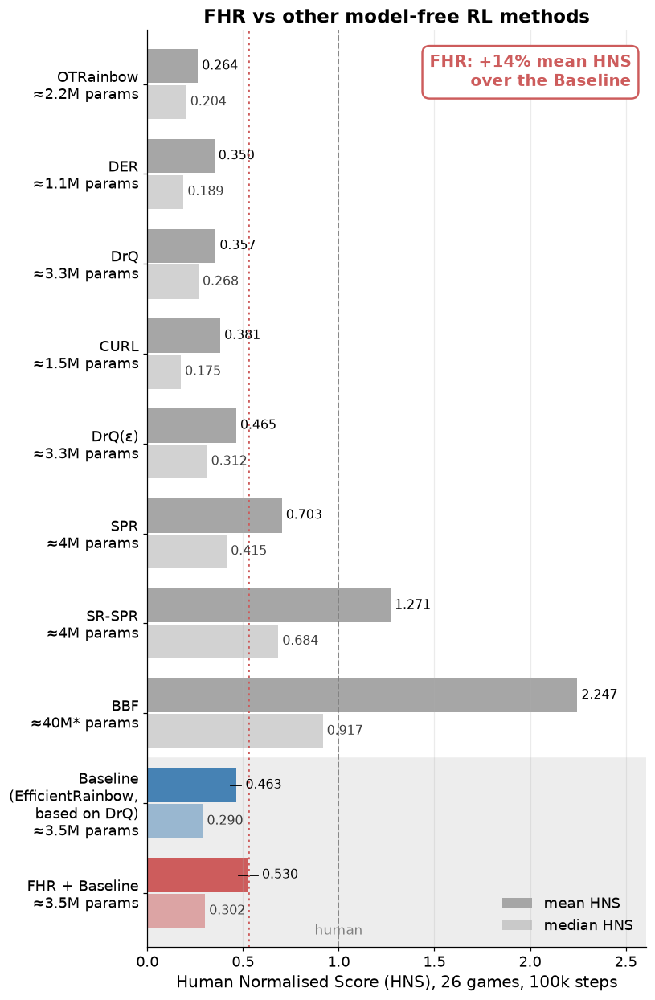

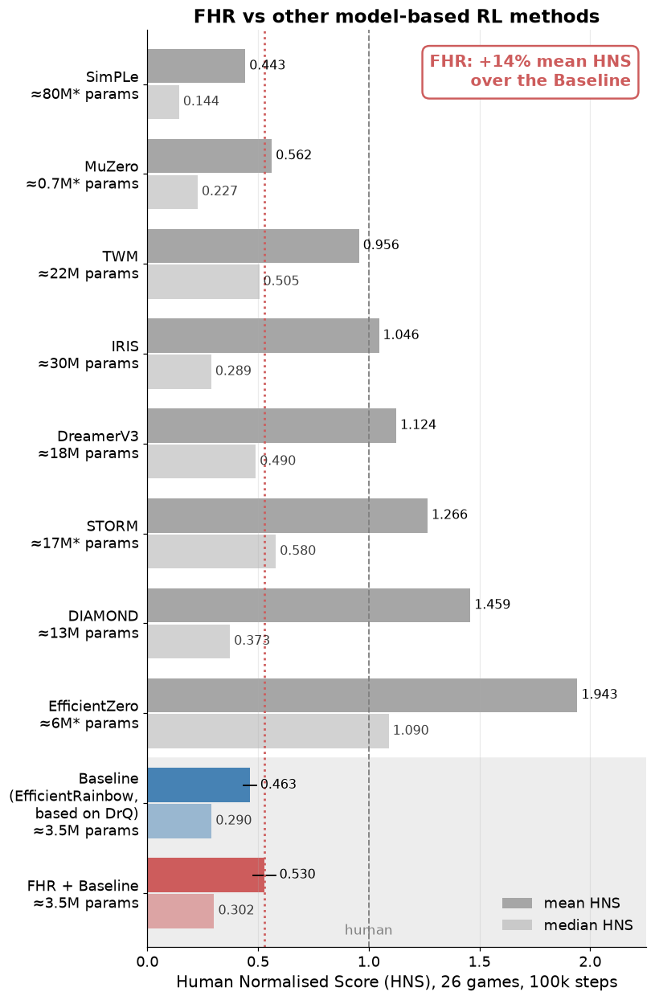

In [6]:
# Approximate trainable-parameter counts of each published method's Atari-100k network
# (full 18-action head; target/EMA copies excluded).  "*" = estimated from the stated
# architecture, not reported by the paper; None -> shown as "params n/r".
PARAMS = {
    # ---- model-free ----
    "OTRainbow": "2.2M",   # Kielak 2020 §5: Dopamine Rainbow (Nature CNN + Dense 512 + 18x51 atoms,
                           #   no noisy/dueling): 78k + 1.61M + 0.47M.  (An earlier poster said 7.5M.)
    "DER":       "1.1M",   # van Hasselt et al. 2019 App. F Tab. 2: 2 convs (32, 64 @5x5/5), flatten 576,
                           #   noisy dueling 256-unit heads, 51 atoms -> 1.14M
    "CURL":      "1.5M",   # Srinivas et al. 2020 App. B: DER network + bilinear W (576x576) -> 1.48M
    "DrQ":       "3.3M",   # Kostrikov et al. 2020 App. C Tab. 4: Nature CNN + 512 dueling head -> 3.30M
    "DrQ(ε)":    "3.3M",   # same network as DrQ, Dopamine eps schedule (Agarwal et al. 2021)
    "SPR":       "4M",     # Schwarzer et al. 2021 §5: "three to four million" parameters
    "SR-SPR":    "4M",     # D'Oro et al. 2023: SPR network + resets (width 1x in BBF Fig. 3)
    "BBF":       "40M*",   # Schwarzer et al. 2023 §4: Impala-CNN width 4x, 2048-unit projection; ~40M if the
                           #   projection is shared by the dueling streams (~70M if not); Fig. 3 prints the count
    # ---- model-based ----
    "SimPLe":        "80M*",  # Kaiser et al. 2020 App. C world-model table (96..768-ch conv/deconv stack)
    "MuZero":        "0.7M*", # EfficientZero's own re-implementation at 100k (Ye et al. 2021 §5.1): its
                              #   1-block/64-plane nets without value-prefix LSTM / SimSiam heads
    "TWM":           "22M",   # Robine et al. 2023 App. A.3 Tab. 5: 21.6M (WM 19M + actor 1.3M + critic 1.3M)
    "IRIS":          "30M",   # quoted by DIAMOND App. H Tab. 4
    "DreamerV3":     "18M",   # Hafner et al. 2023 (v1) Tab. B.1, size S used for Atari-100k; DIAMOND Tab. 4
    "STORM":         "17M*",  # Zhang et al. 2023 App. B Tabs. 3-9 (VAE 9.8M + 2-layer D=512 transformer + heads)
    "DIAMOND":       "13M",   # Alonso et al. 2024 App. H Tab. 4 (diffusion U-Net ~4M of it)
    "EfficientZero": "6M*",   # Ye et al. 2021 App. A.1: repr/dyn 0.4M + value-prefix LSTM 2.3M + SimSiam 3M
}
OUR_PARAMS = "3.5M"        # measured: 3,497,703 (6 actions) – 3,503,859 (18 actions)
POSTER_LABEL = {"baseline": "Baseline\n(EfficientRainbow,\nbased on DrQ)",
                "exp3": "FHR + Baseline"}
POSTER_TITLE = {"model-free": "FHR vs other model-free RL methods",
                "model-based": "FHR vs other model-based RL methods"}

def _plabel(name):
    p = PARAMS.get(name)
    return f"{name}\n≈{p} params" if p else f"{name}\nparams n/r"

def poster_panel(ax, family, title):
    pub = sorted([n for n, d in PUBLISHED.items() if d["family"] == family],
                 key=lambda n: PUBLISHED[n]["mean"])          # ascending: strongest next to ours
    names = [_plabel(n) for n in pub] + [f"{POSTER_LABEL[a]}\n≈{OUR_PARAMS} params" for a in ARMS]
    means = [PUBLISHED[n]["mean"] for n in pub] + [OURS[a][0]["mean"] for a in ARMS]
    meds = [PUBLISHED[n]["median"] for n in pub] + [OURS[a][0]["median"] for a in ARMS]
    cols = ["0.65"] * len(pub) + [OUR_COLOR[a] for a in ARMS]
    y = np.arange(len(names))
    ax.barh(y - 0.2, means, height=0.38, color=cols, label="mean HNS")
    ax.barh(y + 0.2, meds, height=0.38, color=cols, alpha=0.5, label="median HNS")
    for i, a in enumerate(ARMS):
        yi = len(pub) + i; ci = OURS[a][1]["mean"]
        ax.plot(ci, [yi - 0.2, yi - 0.2], color="k", lw=1.2)
    xmax = max(means) * 1.16
    ci_hi = {len(pub) + i: OURS[a][1]["mean"][1] for i, a in enumerate(ARMS)}   # label past the whisker
    for yi, m, md in zip(y, means, meds):
        ax.text(max(m, ci_hi.get(yi, m)) + xmax * 0.008, yi - 0.2, f"{m:.3f}", va="center", fontsize=10.5)
        ax.text(md + xmax * 0.008, yi + 0.2, f"{md:.3f}", va="center", fontsize=10.5, alpha=0.75)
    # reference lines: human (grey dashed) and the FHR mean (red dotted, across the panel)
    ax.axvline(1.0, ls="--", c="gray", lw=1.2)
    ax.axvline(OURS["exp3"][0]["mean"], ls=":", c=OUR_COLOR["exp3"], lw=1.8)
    ax.text(1.0, 0.01, "human", transform=ax.get_xaxis_transform(), ha="center", va="bottom",
            fontsize=11, color="gray")
    lift = 100 * DIFF["mean"][0] / OURS["baseline"][0]["mean"]
    ax.text(0.97, 0.975, f"FHR: {lift:+.0f}% mean HNS\nover the Baseline", transform=ax.transAxes,
            ha="right", va="top", fontsize=13, fontweight="bold", color=OUR_COLOR["exp3"],
            bbox=dict(boxstyle="round,pad=0.45", fc="white", ec=OUR_COLOR["exp3"], lw=1.6))
    ax.set_yticks(y); ax.set_yticklabels(names)
    ax.invert_yaxis(); ax.set_xlim(0, xmax); ax.set_ylim(len(names) - 0.4, -0.6)
    ax.axhspan(len(pub) - 0.5, len(names) - 0.4, color="0.93", zorder=0)
    ax.set_xlabel("Human Normalised Score (HNS), 26 games, 100k steps")
    ax.set_title(title); ax.grid(axis="y", visible=False)
    ax.legend(loc="lower right")

for family in ("model-free", "model-based"):
    with plt.rc_context(REPORT_RC):
        fig, ax = plt.subplots(figsize=(7.6, 11.5))
        poster_panel(ax, family, POSTER_TITLE[family])
        fig.tight_layout()
        save_and_show(fig, f"atari100k_effrainbow_5seed_poster_{family.replace('-', '')}")


## 6 · IQM comparison

IQM is the metric rliable recommends; published values are quoted from the papers
that report per-run IQM (BBF Table A.1, DIAMOND Table 1 — † marks BBF's re-evaluation
of SPR / EfficientZero). Methods with no published IQM (OTRainbow, CURL, DrQ, SimPLe,
MuZero) are omitted here. Our bars carry the stratified-bootstrap 95 % CI.

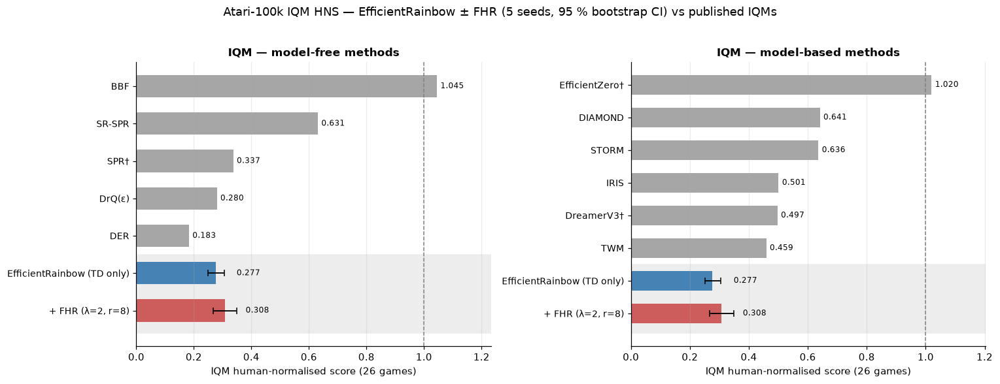

In [7]:
def iqm_panel(ax, family, title):
    pub = sorted([n for n, d in PUBLISHED.items() if d["family"] == family and d["iqm"] is not None],
                 key=lambda n: -PUBLISHED[n]["iqm"])
    names = [n + ("†" if "†" in PUBLISHED[n].get("iqm_src", "") else "") for n in pub] \
            + [OUR_LABEL[a] for a in ARMS]
    vals = [PUBLISHED[n]["iqm"] for n in pub] + [OURS[a][0]["IQM"] for a in ARMS]
    cols = ["0.65"] * len(pub) + [OUR_COLOR[a] for a in ARMS]
    y = np.arange(len(names))
    ax.barh(y, vals, height=0.6, color=cols)
    for i, a in enumerate(ARMS):
        lo, hi = OURS[a][1]["IQM"]; pt = OURS[a][0]["IQM"]
        ax.errorbar(pt, len(pub) + i, xerr=[[pt - lo], [hi - pt]], fmt="none", ecolor="k", capsize=3, lw=1.2)
    xmax = max(vals) * 1.18
    for yi, v in zip(y, vals):
        ax.text(v + xmax * 0.01 + (0.06 if yi >= len(pub) else 0), yi, f"{v:.3f}", va="center", fontsize=8)
    ax.axvline(1.0, ls="--", c="gray", lw=1)
    ax.set_yticks(y); ax.set_yticklabels(names, fontsize=9); ax.invert_yaxis()
    ax.set_xlim(0, xmax); ax.axhspan(len(pub) - 0.5, len(names) - 0.4, color="0.93", zorder=0)
    ax.set_xlabel("IQM human-normalised score (26 games)"); ax.set_title(title)
    ax.grid(axis="y", visible=False)

fig, axes = plt.subplots(1, 2, figsize=(14, 5.2))
iqm_panel(axes[0], "model-free", "IQM — model-free methods")
iqm_panel(axes[1], "model-based", "IQM — model-based methods")
fig.suptitle("Atari-100k IQM HNS — EfficientRainbow ± FHR (5 seeds, 95 % bootstrap CI) vs published IQMs", y=1.02)
fig.tight_layout()
save_and_show(fig, "atari100k_effrainbow_5seed_iqm_modelfree_modelbased")


## 7 · Per-game ΔHNS with seeds

FHR − baseline per game (bar = difference of 5-seed mean HNS; whiskers = 95 % CI from
the per-game seed bootstrap). Sorted; games whose FHR arm has fewer than five seeds are hatched.

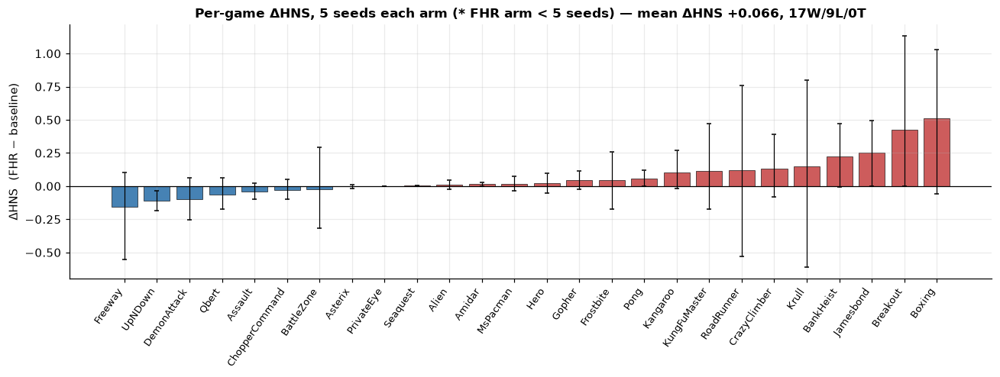

In [8]:
order = sorted(AGG, key=lambda k: DHNS[k])
d_pt, d_lo, d_hi = [], [], []
for k in order:
    f, b = hns_runs(k, "exp3"), hns_runs(k, "baseline")
    reps = [RNG.choice(f, len(f)).mean() - RNG.choice(b, len(b)).mean() for _ in range(N_BOOT)]
    d_pt.append(DHNS[k]); lo, hi = np.percentile(reps, [2.5, 97.5]); d_lo.append(lo); d_hi.append(hi)
d_pt, d_lo, d_hi = map(np.array, (d_pt, d_lo, d_hi))
fig, ax = plt.subplots(figsize=(12, 4.6))
x = np.arange(len(order))
ax.bar(x, d_pt, color=["indianred" if v > 0 else "steelblue" for v in d_pt],
       hatch=["//" if k in ONE_SEED else "" for k in order], edgecolor="k", lw=0.4)
ax.errorbar(x, d_pt, yerr=[d_pt - d_lo, d_hi - d_pt], fmt="none", ecolor="k", capsize=2, lw=0.8)
ax.axhline(0, c="k", lw=0.8)
ax.set_xticks(x); ax.set_xticklabels([k + ("*" if k in ONE_SEED else "") for k in order], rotation=55, ha="right", fontsize=8.5)
ax.set_ylabel("ΔHNS  (FHR − baseline)")
ax.set_title(f"Per-game ΔHNS, 5 seeds each arm (* FHR arm < 5 seeds) — mean ΔHNS {dh.mean():+.3f}, "
             f"{len(wins)}W/{len(losses)}L/{len(ties)}T")
fig.tight_layout()
save_and_show(fig, "atari100k_effrainbow_5seed_delta_hns_per_game")


## 8 · Learning curves — training return vs environment steps

Same grid as section 4 of the seed-0 notebook, pooled over seeds: raw training
episode return (`rewards.csv`, one row per full game; x = cumulative env steps),
rolling-20, then interpolated onto a common 200-point grid. Line = mean over the seeds
whose run directory is on this machine, band = ± 1 s.e.m. over those seeds (drawn
only where ≥ 2 seeds have data). Seed 0 is drawn only when the `effrainbow100k` run
dirs are present (the GB10 machine); on the CX3 clone the curves are seeds 1–4, and
the two games whose FHR arm has seed 0 only get no FHR curve there (marked *).


game            baseline curves   FHR curves
Alien           4 (r1,r2,r3,r4)    4 (r1,r2,r3,r4) 
Amidar          4 (r1,r2,r3,r4)    4 (r1,r2,r3,r4) 
Assault         4 (r1,r2,r3,r4)    4 (r1,r2,r3,r4) 
Asterix         4 (r1,r2,r3,r4)    4 (r1,r2,r3,r4) 
BankHeist       4 (r1,r2,r3,r4)    4 (r1,r2,r3,r4) 
BattleZone      4 (r1,r2,r3,r4)    4 (r1,r2,r3,r4) 
Boxing          4 (r1,r2,r3,r4)    4 (r1,r2,r3,r4) 
Breakout        4 (r1,r2,r3,r4)    4 (r1,r2,r3,r4) 
ChopperCommand  4 (r1,r2,r3,r4)    4 (r1,r2,r3,r4) 
CrazyClimber    4 (r1,r2,r3,r4)    4 (r1,r2,r3,r4) 
DemonAttack     4 (r1,r2,r3,r4)    4 (r1,r2,r3,r4) 
Enduro          4 (r1,r2,r3,r4)    4 (r1,r2,r3,r4) 
Freeway         4 (r1,r2,r3,r4)    4 (r1,r2,r3,r4) 
Frostbite       4 (r1,r2,r3,r4)    4 (r1,r2,r3,r4) 
Gopher          4 (r1,r2,r3,r4)    4 (r1,r2,r3,r4) 
Hero            4 (r1,r2,r3,r4)    4 (r1,r2,r3,r4) 
Jamesbond       4 (r1,r2,r3,r4)    4 (r1,r2,r3,r4) 
Kangaroo        4 (r1,r2,r3,r4)    4 (r1,r2,r3,r4) 
Krull           4 (

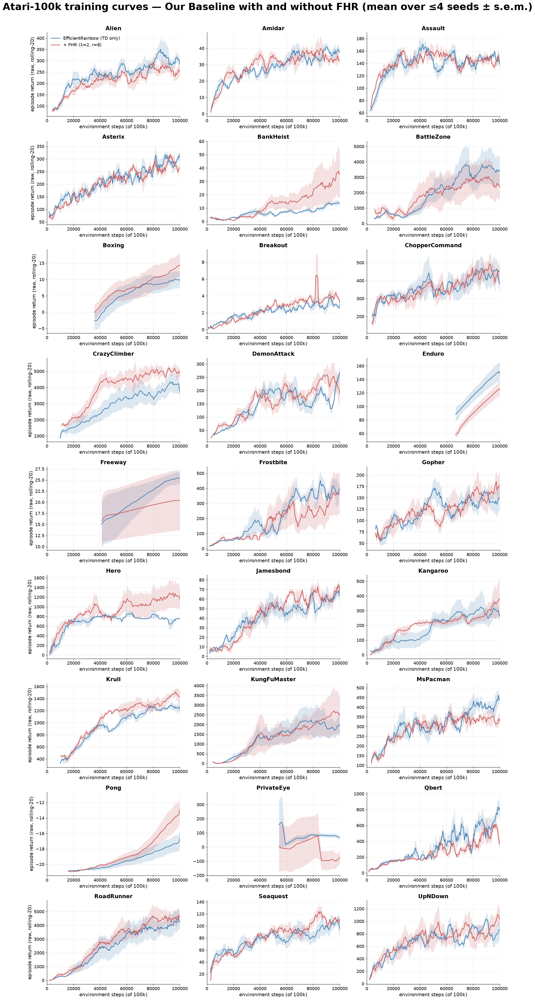

In [9]:
import warnings
from analysis.atari100k import ATARI100K_ENV_STEPS
warnings.filterwarnings("ignore", message="Mean of empty slice")
warnings.filterwarnings("ignore", message="Degrees of freedom <= 0")

def load_curve(run_dir):
    # rewards.csv columns: episode, reward (raw game score), steps (episode length)
    p = run_dir / "rewards.csv"
    if not p.exists():
        return None
    t = np.loadtxt(p, delimiter=",", skiprows=1, ndmin=2)
    return (t[:, 1], np.cumsum(t[:, 2])) if t.shape[1] > 2 else None

# CURVES[game][arm] = [(family, seed, rewards, env_steps)] for every run dir on this machine
CURVES = {k: {a: [] for a in ARMS} for k in GAMES}
for gd in sorted(HERE.glob("dqn_*")):
    if not (gd / REF_CONFIG).exists():
        continue
    key = game_key(yaml.safe_load(open(gd / REF_CONFIG))["environment"]["name"])
    for fam, man in (("seed0", SEED0_MANIFEST), ("ref", REF_MANIFEST)):
        if not (gd / man).exists():
            continue
        runs = json.load(open(gd / man))["runs"]
        for arm in ARMS:
            for seed, rel in sorted(runs.get(arm, {}).items()):
                c = load_curve(gd / rel)
                if c is not None:
                    CURVES[key][arm].append((fam, seed, *c))
NO_CURVE = [k for k in GAMES if any(not CURVES[k][a] for a in ARMS)]
print(f"{'game':15s} baseline curves   FHR curves")
for k in GAMES:
    print(f"{k:15s} " + "   ".join(f"{len(CURVES[k][a])} ({','.join(f'{f[0]}{s}' for f, s, *_ in CURVES[k][a])})".ljust(16)
                                  for a in ARMS) + ("   <-- no FHR log here" if k in NO_CURVE else ""))

def rolling(x, w):
    x = np.asarray(x, float)
    return x if len(x) < w else np.convolve(x, np.ones(w) / w, mode="valid")

def curve_on_grid(curves, w=20, n=200):
    grid = np.linspace(0, ATARI100K_ENV_STEPS, n)
    stack = np.full((len(curves), n), np.nan)
    for i, (_, _, rewards, steps) in enumerate(curves):
        if len(rewards) < w:
            continue
        y = rolling(rewards, w)
        xs = steps[len(steps) - len(y):]
        inside = (grid >= xs[0]) & (grid <= xs[-1])
        stack[i, inside] = np.interp(grid[inside], xs, y)
    return grid, stack

n_max = max(len(CURVES[k][a]) for k in GAMES for a in ARMS)
with plt.rc_context(REPORT_RC):
    fig, axes = plt.subplots(NROWS, NCOLS, figsize=(6.2 * NCOLS, 4.2 * NROWS), squeeze=False)
    for ax in axes.flat[len(GAMES):]:
        ax.set_visible(False)
    for ax, k in zip(axes.flat, GAMES):
        for arm in ARMS:
            if not CURVES[k][arm]:
                continue
            grid, stack = curve_on_grid(CURVES[k][arm])
            n_ok = np.sum(~np.isnan(stack), axis=0)
            m = np.nanmean(stack, axis=0)
            ax.plot(grid, m, color=OUR_COLOR[arm], lw=1.8, label=OUR_LABEL[arm])
            if stack.shape[0] > 1:
                sem = np.nanstd(stack, axis=0, ddof=1) / np.sqrt(np.maximum(n_ok, 1))
                band = np.where(n_ok >= 2, sem, np.nan)
                ax.fill_between(grid, m - band, m + band, color=OUR_COLOR[arm], alpha=0.18, lw=0)
        ax.set_title(k + ("  * (no FHR log on this machine)" if k in NO_CURVE else ""))
        ax.set_xlabel("environment steps (of 100k)")
        ax.set_xlim(0, ATARI100K_ENV_STEPS)
    for row in axes:
        row[0].set_ylabel("episode return (raw, rolling-20)")
    axes.flat[0].legend(loc="upper left")
    fig.suptitle(f"Atari-100k training curves — Our Baseline with and without FHR "
                 f"(mean over ≤{n_max} seeds ± s.e.m.)",
                 fontsize=27, fontweight="bold", y=1.0 + 0.03 / NROWS)
    fig.tight_layout()
    save_and_show(fig, "atari100k_effrainbow_5seed_learning_curves")


## 9 · Hankel spectrum decay of the greedy-rollout Q and V traces

Atari analogue of the MountainCar poster figure (`spectrum_evolution` in
`experiments/stable_baselines_3/mountaincar/cached/poster_figures/make_poster_figures.py`),
built from the analysis ticks the ref runs already logged — nothing is recomputed from
checkpoints. Every tick (`analysis.ep_freq: 200`, so episodes 0, 200, 400, …; the tick
fires after that episode ends) rolls the greedy policy out once from env seed 52, records
the per-step $Q(s_t, a_t)$ and dueling-stream $V(s_t)$ traces, forms the square Hankel
matrix of each and writes its rank metrics plus the **top-12 singular values** to
`hankel_sweep.csv` (`src/analysis/low_rank/hankel_policy.py`). The tick's env-step position
is the cumulative episode length through its episode (`rewards.csv`).

Read with these caveats:

- **Only 12 singular values per tick** are on disk (`RunLogger.SWEEP_N_SV`), so the
  index axis stops at 12 where the MountainCar figure runs to 100; the Hankel itself is
  ~(H/2)² for a rollout of H steps. The raw traces were not saved
  (`save_trajectories: false`) and the advantage trace was never requested
  (`functions: [Hankel Q, Hankel V]`), so no $A(s_t, a_t)$ spectrum exists.
- **Ticks are episode-gated**, so games with long episodes (Boxing, CrazyClimber, Enduro,
  Freeway, Pong, PrivateEye) only ever got the episode-0 tick, i.e. an untrained network
  at ≤ 3k env steps; most other games have ticks near 0, ~40k and ~90k steps.
- $\sigma_i / \sigma_1$ is dominated by the trace's mean level: a nearly constant trace is a
  numerically rank-1 Hankel whatever its dynamics, which is what the episode-0 $V$ lines
  show (σ₂/σ₁ ≈ 10⁻³). The full-rank reference is the mean normalised spectrum of i.i.d.
  Gaussian matrices, drawn at a capped 400×400 shape (flat to a few % over 12 indices).

The showcase picks the game with the most ticks in both arms (override `SHOWCASE_GAME`);
the two grids show every game with the baseline solid and the FHR arm dotted.

game            baseline ticks @ env steps (k)         FHR ticks @ env steps (k)
Alien           10: 0,0,0,0,41,45,47,48,85,95          12: 0,0,0,0,39,40,43,45,76,84,87,91
Amidar          12: 0,0,0,0,40,41,42,42,89,90,91,93    12: 0,0,0,0,38,39,43,45,88,89,92,94
Assault          8: 0,0,0,0,55,56,63,65                 8: 0,0,0,0,54,54,59,63
Asterix         20: 0,0,0,0,19,20,21,21,40,42,42,44,65,66,67,71,92,93,95,98 20: 0,0,0,0,18,18,19,19,40,41,41,43,65,66,67,70,92,92,93,97
BankHeist       12: 0,0,0,0,38,44,44,50,78,86,87,99    11: 0,0,0,0,40,43,45,48,82,83,88
BattleZone       7: 0,0,0,0,57,71,98                    8: 0,0,0,0,54,66,76,99
Boxing           4: 2,2,2,2                             4: 2,2,2,2
Breakout        18: 0,0,0,0,15,17,18,21,38,40,46,46,64,67,72,76,93,95 20: 0,0,0,0,18,18,21,22,39,39,42,45,61,62,66,67,87,90,92,99
ChopperCommand  13: 0,0,0,0,32,34,39,39,59,73,79,89,93 12: 0,0,0,1,33,37,37,37,69,80,82,88
CrazyClimber     4: 0,1,1,1                             4: 0,0,1,1


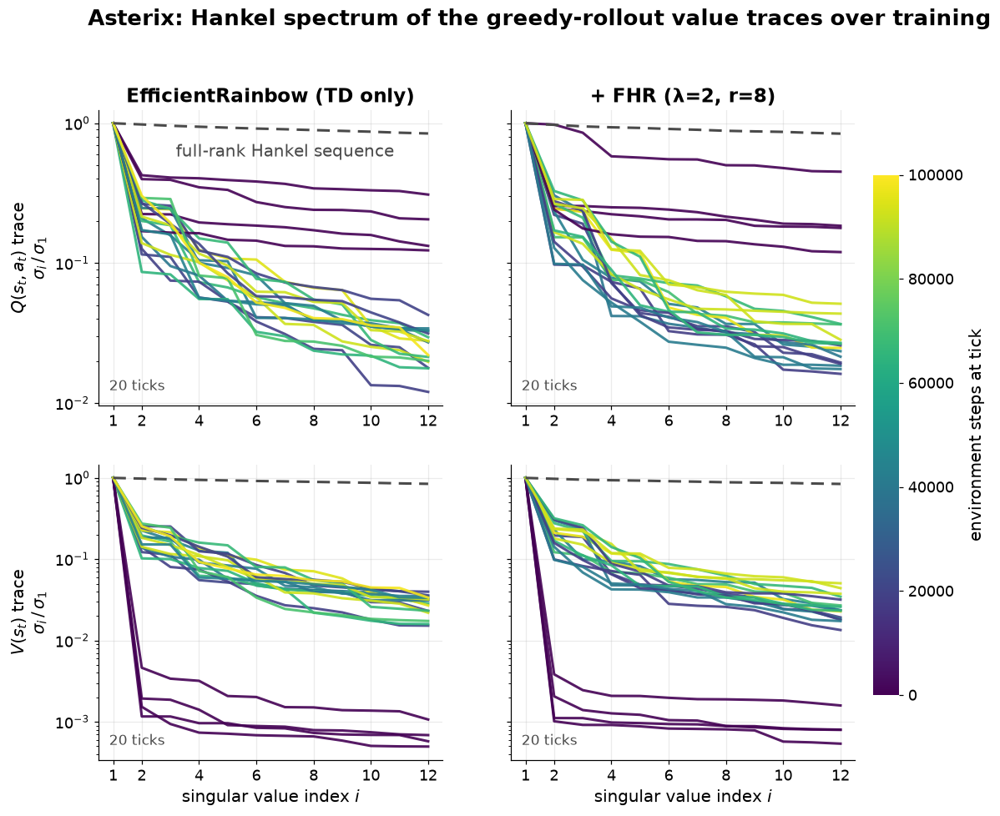

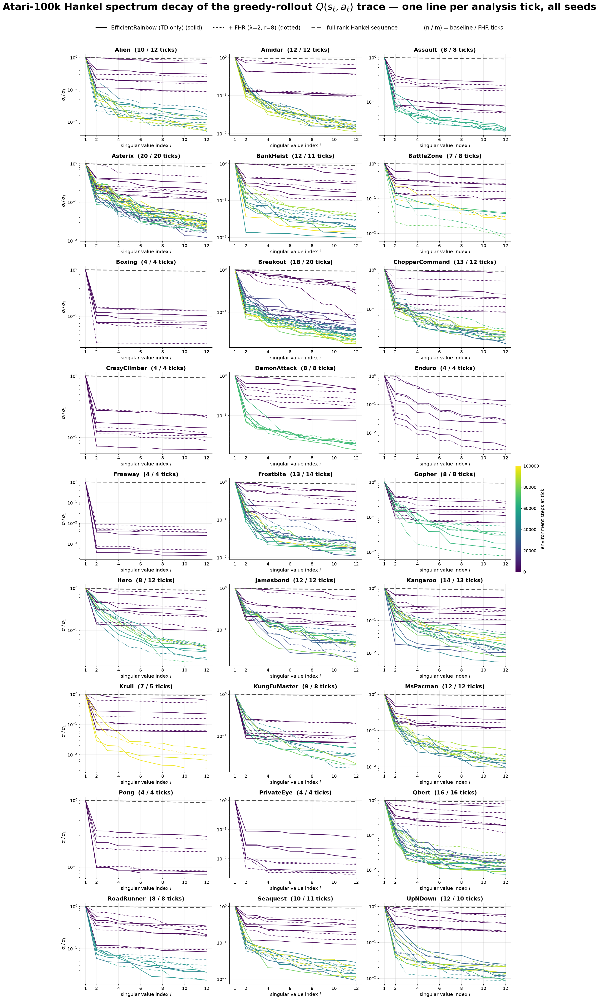

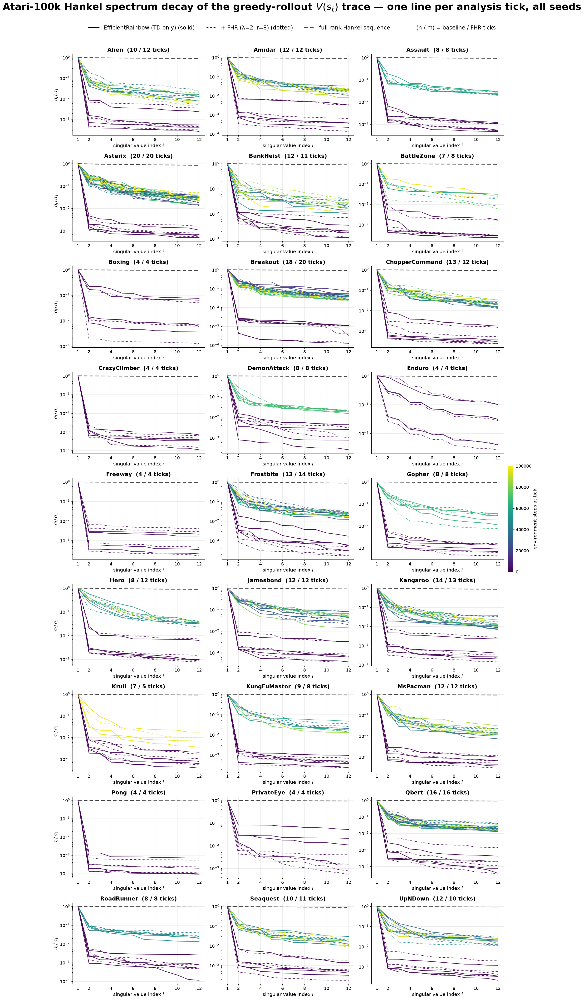

In [10]:
# Hankel spectrum decay of the greedy-rollout Q(s_t, a_t) and V(s_t) traces over training.
# Every analysis tick (analysis.ep_freq = 200 episodes in the ref configs, i.e. episodes
# 0, 200, 400, ...) rolls the greedy policy out once (seed 52), builds the square Hankel
# matrix of each per-step trace and writes its top-12 singular values to hankel_sweep.csv.
# A tick fires after its episode ends, so its env-step position is the cumulative episode
# length through that episode (rewards.csv). One line per tick, pooled over every seed of an
# arm and coloured by env steps. The grey dashed line is the mean normalised spectrum of
# i.i.d. Gaussian matrices ("full-rank Hankel sequence", the MountainCar poster reference);
# over the first 12 indices it is flat to within a few % for any Hankel larger than ~400x400,
# so it is drawn at a capped shape to keep the SVDs cheap.
import csv
from matplotlib import cm
from matplotlib.colors import Normalize
from analysis.atari100k import ATARI100K_ENV_STEPS

N_SV = 12                                   # sv_01..sv_12 columns of hankel_sweep.csv
MATRICES = ["Hankel Q", "Hankel V"]
MATRIX_LABEL = {"Hankel Q": r"$Q(s_t, a_t)$ trace", "Hankel V": r"$V(s_t)$ trace"}

def load_ticks(run_dir):
    """[(env_steps, matrix, sigma_i / sigma_1, (n_rows, n_cols))] per Hankel tick of one run."""
    p = run_dir / "hankel_sweep.csv"
    if not p.exists() or not (run_dir / "rewards.csv").exists():
        return []
    t = np.loadtxt(run_dir / "rewards.csv", delimiter=",", skiprows=1, ndmin=2)
    if t.shape[1] < 3:
        return []
    cum = np.cumsum(t[:, 2])
    out = []
    for r in csv.DictReader(open(p)):
        e = int(r["episode"])
        sv = np.array([float(r.get(f"sv_{j + 1:02d}") or "nan") for j in range(N_SV)])
        sv = sv[np.isfinite(sv)]
        if e >= len(cum) or sv.size == 0 or sv[0] <= 0:
            continue
        out.append((int(cum[e]), r["matrix"], sv / sv[0],
                    (int(r["n_rows"]), int(r["n_cols"]))))
    return out

# TICKS[game][arm] = [(family, seed, env_steps, matrix, spectrum, shape)] over every run dir here
TICKS = {k: {a: [] for a in ARMS} for k in GAMES}
for gd in sorted(HERE.glob("dqn_*")):
    if not (gd / REF_CONFIG).exists():
        continue
    key = game_key(yaml.safe_load(open(gd / REF_CONFIG))["environment"]["name"])
    for fam, man in (("seed0", SEED0_MANIFEST), ("ref", REF_MANIFEST)):
        if not (gd / man).exists():
            continue
        runs = json.load(open(gd / man))["runs"]
        for arm in ARMS:
            for seed, rel in sorted(runs.get(arm, {}).items()):
                TICKS.setdefault(key, {a: [] for a in ARMS})[arm] += [
                    (fam, seed, *tk) for tk in load_ticks(gd / rel)]

def tick_steps(k, arm, matrix="Hankel V"):
    return sorted(e for _, _, e, m, *_ in TICKS[k][arm] if m == matrix)

print(f"{'game':15s} {'baseline ticks @ env steps (k)':38s} FHR ticks @ env steps (k)")
for k in GAMES:
    cells = [f"{len(s):2d}: " + ",".join(f"{e / 1000:.0f}" for e in s)
             for s in (tick_steps(k, a) for a in ARMS)]
    print(f"{k:15s} {cells[0]:38s} {cells[1]}")
NO_TICKS = [k for k in GAMES if any(not TICKS[k][a] for a in ARMS)]

_rng = np.random.default_rng(0)
_ref_cache = {}
def full_rank_ref(shape, n=N_SV, cap=400, draws=6):
    """Top-n normalised spectrum of i.i.d. Gaussian matrices of `shape` (each side capped)."""
    shape = (min(shape[0], cap), min(shape[1], cap))
    if shape not in _ref_cache:
        ref = np.mean([np.linalg.svd(_rng.standard_normal(shape), compute_uv=False)[:n]
                       for _ in range(draws)], axis=0)
        _ref_cache[shape] = ref / ref[0]
    return _ref_cache[shape]

GRAY = "#4a4a4a"
CMAP = plt.get_cmap("viridis")
NORM = Normalize(vmin=0, vmax=ATARI100K_ENV_STEPS)
ARM_LS = {"baseline": "-", "exp3": (0, (1.2, 1.2))}    # FHR arm dotted when arms share a panel
REF_LS = (0, (5, 3))
LEGEND_HANDLES = [plt.Line2D([], [], color="k", ls=ARM_LS["baseline"], lw=1.6),
                  plt.Line2D([], [], color="k", ls=ARM_LS["exp3"], lw=1.6),
                  plt.Line2D([], [], color=GRAY, ls=REF_LS, lw=2)]

def spectrum_panel(ax, k, matrix, arms=ARMS, ls=None, lw=1.5):
    """One line per tick (sigma_i / sigma_1 vs i) for `matrix` of game k; returns #lines."""
    n, shapes = 0, []
    for arm in arms:
        for _, _, env_steps, m, spec, shape in TICKS[k][arm]:
            if m != matrix:
                continue
            ax.plot(np.arange(1, len(spec) + 1), np.where(spec > 0, spec, np.nan),
                    color=CMAP(NORM(env_steps)), ls=ls or ARM_LS[arm], lw=lw, alpha=0.9, zorder=2)
            shapes.append(shape); n += 1
    if shapes:
        r = full_rank_ref(max(shapes, key=min))
        ax.plot(np.arange(1, len(r) + 1), r, ls=REF_LS, color=GRAY, lw=2, zorder=3)
    ax.set_yscale("log")
    ax.set_xlim(0.5, N_SV + 0.5); ax.set_xticks([1, 2, 4, 6, 8, 10, 12])
    return n

def add_step_colorbar(fig, ax, **kw):
    cb = fig.colorbar(cm.ScalarMappable(norm=NORM, cmap=CMAP), ax=ax, **kw)
    cb.set_label("environment steps at tick")
    cb.outline.set_visible(False)
    return cb

# ---- showcase: one game, Q and V traces x baseline / FHR (MountainCar-poster layout) ----
SHOWCASE_GAME = None            # e.g. "Hero"; None -> the game with the most V-trace ticks
if SHOWCASE_GAME is None:
    SHOWCASE_GAME = max(GAMES, key=lambda k: (min(len(tick_steps(k, a)) for a in ARMS), k))
print(f"\nshowcase game: {SHOWCASE_GAME} "
      f"({', '.join(f'{OUR_LABEL[a]}: {len(tick_steps(SHOWCASE_GAME, a))} ticks' for a in ARMS)})")
with plt.rc_context(REPORT_RC):
    fig, axes = plt.subplots(len(MATRICES), len(ARMS), figsize=(6.4 * len(ARMS), 4.6 * len(MATRICES)),
                             sharey="row", squeeze=False)
    for i, matrix in enumerate(MATRICES):
        for j, arm in enumerate(ARMS):
            ax = axes[i, j]
            n = spectrum_panel(ax, SHOWCASE_GAME, matrix, arms=[arm], ls="-", lw=2.0)
            ax.text(0.03, 0.04, f"{n} ticks", transform=ax.transAxes, ha="left", va="bottom",
                    fontsize=11, color=GRAY)
            if i == 0:
                ax.set_title(OUR_LABEL[arm])
            if i == len(MATRICES) - 1:
                ax.set_xlabel("singular value index $i$")
        axes[i, 0].set_ylabel(MATRIX_LABEL[matrix] + "\n" + r"$\sigma_i \, / \, \sigma_1$")
    r = full_rank_ref((400, 400))
    axes[0, 0].annotate("full-rank Hankel sequence", xy=(7, r[6]), xytext=(0, -14),
                        textcoords="offset points", ha="center", va="top", color=GRAY)
    add_step_colorbar(fig, axes.ravel().tolist(), pad=0.02, shrink=0.8)
    fig.suptitle(f"{SHOWCASE_GAME}: Hankel spectrum of the greedy-rollout value traces over training",
                 fontsize=17, fontweight="bold", y=1.0)
    save_and_show(fig, f"atari100k_effrainbow_5seed_hankel_spectrum_{SHOWCASE_GAME.lower()}")

# ---- all games: one panel per game, both arms (baseline solid, FHR dotted), per trace ----
for matrix in MATRICES:
    with plt.rc_context(REPORT_RC):
        fig, axes = plt.subplots(NROWS, NCOLS, figsize=(6.2 * NCOLS, 4.2 * NROWS), squeeze=False)
        for ax in axes.flat[len(GAMES):]:
            ax.set_visible(False)
        for ax, k in zip(axes.flat, GAMES):
            spectrum_panel(ax, k, matrix)
            nb, nf = (len(tick_steps(k, a, matrix)) for a in ARMS)
            ax.set_title(f"{k}  ({nb} / {nf} ticks)" + ("  *" if k in NO_TICKS else ""))
            ax.set_xlabel("singular value index $i$")
        for row in axes:
            row[0].set_ylabel(r"$\sigma_i \, / \, \sigma_1$")
        fig.legend(LEGEND_HANDLES + [plt.Line2D([], [], ls="")],
                   [OUR_LABEL["baseline"] + " (solid)", OUR_LABEL["exp3"] + " (dotted)",
                    "full-rank Hankel sequence",
                    "(n / m) = baseline / FHR ticks" + ("; * = no FHR run on this machine" if NO_TICKS else "")],
                   loc="upper center", bbox_to_anchor=(0.5, 0.992), ncol=4, fontsize=15)
        fig.suptitle(f"Atari-100k Hankel spectrum decay of the greedy-rollout {MATRIX_LABEL[matrix]} — "
                     f"one line per analysis tick, all seeds",
                     fontsize=27, fontweight="bold", y=1.0 + 0.09 / NROWS)
        fig.tight_layout(rect=(0, 0, 0.965, 0.985))
        add_step_colorbar(fig, axes.ravel().tolist(), fraction=0.012, pad=0.01, shrink=0.35)
        save_and_show(fig, f"atari100k_effrainbow_5seed_hankel_spectrum_grid_{matrix.split()[-1].lower()}")

## 10 · Notes for the write-up

**Executed 2026-09-16 on the CX3 clone: 26 suite games + Enduro, seeds 0–4 on both arms
(270 runs pooled, campaign complete).**

- **Aggregate HNS (26 games)**: baseline **0.463 mean / 0.290 median / 0.277 IQM** →
  +FHR **0.530 / 0.302 / 0.308**. Mean lift +0.066 [95 % CI +0.011, +0.121] = **+14 %
  relative**; IQM lift +0.031 [−0.016, +0.079] = **+11 %**; median +0.011 (+4 %). The
  mean-HNS CI excludes zero; the IQM and median CIs do not.
- **Per-game: 17 wins / 9 losses** on the 26 suite games (per-game mean score);
  ΔHNS mean +0.066, median +0.020, IQR [−0.019, +0.118]; P(FHR > baseline) over seed
  pairs = 0.55. The seed-0 headline (+18 %, 0.460 → 0.544) shrinks to +14 % with five
  seeds: the big seed-0 wins stay positive but smaller (Boxing +1.47 → +0.51, Krull
  +0.77 → +0.15, BankHeist +0.62 → +0.22, Frostbite +0.35 → +0.05), Breakout and
  Jamesbond flip from losses to wins (+0.43, +0.25), Qbert flips to a loss (−0.06),
  and the losses are moderate (Freeway −0.16, UpNDown −0.11, DemonAttack −0.10).
  The eight recovered runs (2026-09-15/16) settled the two games that were seed-0-only
  on 2026-09-11: MsPacman is a small 5-seed win (+0.02, was −0.02) and KungFuMaster a
  noisy one (+0.11; FHR seeds score 9.8k / 26.9k / 8.3k / 7.2k / 4.7k, 11.4k ± 8.9k vs
  baseline 8.9k ± 4.1k). Earlier executions read 0.525 / 0.302 / 0.307, 16 W / 10 L
  (2026-09-11, 262 runs) and 0.536 / 0.302 / 0.315, 17 W / 9 L (2026-09-16 morning,
  268 runs, KungFuMaster on 3 FHR seeds).
- **Position among published methods** (poster figure): FHR's mean 0.530 sits above
  OTRainbow, DER, CURL, DrQ, DrQ(ε) and SimPLe, and below SPR, SR-SPR, BBF, MuZero
  and every world-model method (TWM upward). As in the seed-0 notebook these are
  their own, heavier recipes — they contextualise the axis, they are not ablations.
- **Honest claim shape**: *under the EfficientRainbow recipe at replay ratio 2, adding
  λ·Huber(order-8 recurrence residual) to the TD loss raises the 26-game mean HNS
  from 0.463 to 0.530 (+14 %, bootstrap CI excludes zero) and the IQM from 0.277 to
  0.308 (+11 %, CI includes zero), winning 17 of 26 games over 5 seeds.*
- The campaign is complete (216/216). LaTeX/pgfplots versions of the poster bars, the
  per-game ΔHNS and the learning curves come from `experiments/src/export_atari100k_pgfplots.py`
  (→ `docs/figures/atari100k/`), built from the same data and seeded bootstrap as this
  notebook; re-run it after any re-execution here.

- **Hankel spectra (section 9)**: at the episode-0 tick the $V(s_t)$ trace is numerically
  rank-1 (σ₂/σ₁ ≈ 10⁻³, a near-constant untrained value head) and training *raises* the
  normalised tail to 10⁻²–10⁻¹ — the trained $V$ trace carries more modes, the opposite
  direction to MountainCar's untrained-full-rank → trained-low-rank picture. The
  $Q(s_t, a_t)$ trace goes the MountainCar way (flat ≈ 0.1–1 at episode 0, decaying to
  ≈ 10⁻² by $i = 12$ once trained) but only by ~2 decades over the 12 logged values.
  Baseline and FHR ticks interleave in every game — no visible spectral separation at
  this resolution. Six long-episode games have no trained tick at all (episode gate).